In [3]:

import pandas as pd
from pathlib import Path
import pyarrow.parquet as pq
from dataclasses import dataclass
import hvplot.pandas 
# hv.renderer('bokeh').theme = 'dark_minimal'

# Data Loading
It is always a good advice to use standard formats to transfer data from one computer to another. One of the most used formats is parquet. The following code should help you to load the data into your python environment.

In [4]:



# dataset_root = Path(r"C:\Users\Raffael\Documents\Datasets\alpiq_2023") # Raw string works without escaping \
dataset_root = Path(r"C:/Users/jadbh\Documents/Swisse/EPFL/courses/Fall 2024/Machine Learning for Predictive Maintenance/project/Dataset")
dataset_root = Path(r"C:\Users\jadbh\Documents\Swisse\EPFL\courses\Fall 2024\Machine Learning for Predictive Maintenance\project\team repo\Machine-Learning-for-Predictive-Maintenance-project\Dataset")


@dataclass
class Case():
    info: pd.DataFrame
    measurements: pd.DataFrame


class RawDataset():

    def __init__(self, root, unit = "VG4", load_training=False, load_synthetic=False) -> None:
        
        
        read_pq_file = lambda f: pq.read_table(root / f).to_pandas()
        
        
        cases = {
            "test": [f"{unit}_generator_data_testing_real_measurements.parquet", root / f"{unit}_generator_data_testing_real_info.csv" ], 
        }
        
        if load_training:
            cases = {
                **cases,
                "train": [f"{unit}_generator_data_training_measurements.parquet", root / f"{unit}_generator_data_training_info.csv" ], 
            }
        
        if load_synthetic:
            cases = {
                **cases,
                "test_s01": [f"{unit}_generator_data_testing_synthetic_01_measurements.parquet", root / f"{unit}_generator_data_testing_synthetic_01_info.csv"], 
                "test_s02": [f"{unit}_generator_data_testing_synthetic_02_measurements.parquet", root / f"{unit}_generator_data_testing_synthetic_02_info.csv"]
            }
        
        
        self.data_dict = dict()
        
        for id_c, c in cases.items():
            # if you need to verify the parquet header:
            # pq_rows = RawDataset.read_parquet_schema_df(root / c[0])
            info = pd.read_csv(c[1])
            measurements = read_pq_file(c[0])
            self.data_dict[id_c] = Case(info, measurements)
            
        
        
    @staticmethod
    def read_parquet_schema_df(uri: str) -> pd.DataFrame:
        """Return a Pandas dataframe corresponding to the schema of a local URI of a parquet file.

        The returned dataframe has the columns: column, pa_dtype
        """
        # Ref: https://stackoverflow.com/a/64288036/
        schema = pq.read_schema(uri, memory_map=True)
        schema = pd.DataFrame(({"column": name, "pa_dtype": str(pa_dtype)} for name, pa_dtype in zip(schema.names, schema.types)))
        schema = schema.reindex(columns=["column", "pa_dtype"], fill_value=pd.NA)  # Ensures columns in case the parquet file has an empty dataframe.
        return schema
    

rds_u4 = RawDataset(dataset_root, "VG4", load_synthetic=False, load_training=True)
rds_u5 = RawDataset(dataset_root, "VG5", load_synthetic=True, load_training=True)
rds_u6 = RawDataset(dataset_root, "VG6", load_synthetic=True)

# Operation Modes

As you can see, the operation modes (at the very bottom) are not in the info schema, but you can find them when you explore the parquet schema (metadata of the parquet data file).

In [5]:
RawDataset.read_parquet_schema_df(dataset_root / "VG4_generator_data_testing_real_measurements.parquet")

,column,pa_dtype
0,tot_activepower,double
1,plant_tmp,double
2,ext_tmp,double
3,water_primary_cold_tmp,double
4,water_primary_hot_tmp,double
5,valve_opening,double
6,refri_bath_level,double
7,aspi_bath_level,double
8,canal_level,double
9,canal_tmp,double


We can use `head()` to glance at the data.

In [6]:
rds_u4.data_dict["train"].info.head()

,Unnamed: 0,signal_name,attribute_name,asset,unit,element,signal_type,control_signal,input_feature,output_feature,core_attribute
0,0,FMHL_SUP_VEY.MHL_VG4_G4_P,tot_activepower,Veytaux 1,VG4,Generator,Measurement,False,True,True,False
1,1,FMHL_SUP_VEY.MHL_VGE_PRAP_TEMP_USINE,plant_tmp,Veytaux 1,General,Plant,Measurement,False,False,True,False
2,2,FMHL_SUP_VEY.MHL_V2_EAU0_TEMP_EXT,ext_tmp,Veytaux 1,General,Plant,Measurement,False,False,True,False
3,3,FMHL_SUP_VEY.MHL_VGE_PRAP_CLI_TEMP_DEP,water_primary_cold_tmp,Veytaux 1,General,Cooling,Measurement,False,False,True,False
4,4,FMHL_SUP_VEY.MHL_VGE_PRAP_CLI_TEMP_RET,water_primary_hot_tmp,Veytaux 1,General,Cooling,Measurement,False,False,True,False


In [7]:
rds_u4.data_dict["train"].info.columns

Index(['Unnamed: 0', 'signal_name', 'attribute_name', 'asset', 'unit',
       'element', 'signal_type', 'control_signal', 'input_feature',
       'output_feature', 'core_attribute'],
      dtype='object')

In [8]:
rds_u4.data_dict["train"].measurements.head()

,tot_activepower,plant_tmp,ext_tmp,water_primary_cold_tmp,water_primary_hot_tmp,valve_opening,refri_bath_level,aspi_bath_level,canal_level,canal_tmp,...,water_circ_hot_02_tmp,water_circ_cold_tmp,machine_on,machine_off,turbine_mode,all,equilibrium_turbine_mode,dyn_only_on,pump_mode,equilibrium_pump_mode
2020-01-02 00:00:00+01:00,-39.830002,16.516650,5.961580,10.90,12.826471,99.875000,2.956812,5.932592,371.846035,9.000000,...,16.882689,12.220884,True,False,False,True,False,True,False,False
2020-01-02 00:00:30+01:00,-62.433334,16.554980,5.992895,10.85,12.914706,99.873437,2.955667,5.927700,371.836559,8.912023,...,16.797366,12.095122,True,False,False,True,False,True,True,True
2020-01-02 00:01:00+01:00,-62.571904,16.593311,6.024210,10.80,13.002564,99.871875,2.960449,5.922808,371.711225,8.824047,...,16.712043,11.969360,True,False,False,True,False,True,True,True
2020-01-02 00:01:30+01:00,-62.507894,16.631641,6.055526,10.85,13.079487,99.870312,2.968310,5.917917,371.765866,8.736070,...,16.626720,11.825357,True,False,False,True,False,True,True,True
2020-01-02 00:02:00+01:00,-62.397368,16.669971,6.086841,10.90,13.126829,99.868750,2.979270,5.913025,371.842773,8.648094,...,16.369280,11.608393,True,False,False,True,False,True,True,True


In [9]:
rds_u4.data_dict["train"].measurements.iloc[40:50,:]

,tot_activepower,plant_tmp,ext_tmp,water_primary_cold_tmp,water_primary_hot_tmp,valve_opening,refri_bath_level,aspi_bath_level,canal_level,canal_tmp,...,water_circ_hot_02_tmp,water_circ_cold_tmp,machine_on,machine_off,turbine_mode,all,equilibrium_turbine_mode,dyn_only_on,pump_mode,equilibrium_pump_mode
2020-01-02 00:20:00+01:00,-62.745068,16.327441,5.907571,12.053125,15.531818,99.875,3.313182,5.930063,371.821177,8.0,...,16.824439,12.271485,True,False,False,True,False,False,True,True
2020-01-02 00:20:30+01:00,-62.786165,16.347461,5.907961,12.100000,15.600000,99.875,3.321816,5.931702,371.809053,8.0,...,16.852880,12.303060,True,False,False,True,False,False,True,True
2020-01-02 00:21:00+01:00,-62.827262,16.367480,5.908350,12.036170,15.527778,99.875,3.332207,5.933341,371.797931,8.0,...,16.881321,12.301500,True,False,False,True,False,False,True,True
2020-01-02 00:21:30+01:00,-62.769434,16.387500,5.908739,12.104616,15.617334,99.875,3.340800,5.934980,371.815875,8.0,...,16.901055,12.291656,True,False,False,True,False,False,True,True
2020-01-02 00:22:00+01:00,-62.831698,16.407520,5.909129,12.150769,15.657333,99.875,3.348000,5.936619,371.833820,8.0,...,16.892178,12.281812,True,False,False,True,False,False,True,True
2020-01-02 00:22:30+01:00,-62.765001,16.427539,5.905207,12.196923,15.697333,99.875,3.359250,5.938258,371.851764,8.0,...,16.883301,12.271969,True,False,False,True,False,False,True,True
2020-01-02 00:23:00+01:00,-62.840000,16.454297,5.893838,12.200000,15.735000,99.875,3.366696,5.939897,371.861480,8.0,...,16.874424,12.262125,True,False,False,True,False,False,True,True
2020-01-02 00:23:30+01:00,-62.775294,16.485547,5.882470,12.200000,15.772500,99.875,3.374882,5.941536,371.856984,8.0,...,16.865548,12.252281,True,False,False,True,False,False,True,True
2020-01-02 00:24:00+01:00,-62.808002,16.516797,5.871102,12.200000,15.800000,99.875,3.384667,5.943176,371.852488,8.0,...,16.856671,12.242437,True,False,False,True,False,False,True,True
2020-01-02 00:24:30+01:00,-62.764001,16.548047,5.859733,12.300000,15.800000,99.875,3.392035,5.944815,371.847992,8.0,...,16.847794,12.232594,True,False,False,True,False,False,True,True


In [10]:
rds_u4.data_dict["train"].measurements.sample(10)

,tot_activepower,plant_tmp,ext_tmp,water_primary_cold_tmp,water_primary_hot_tmp,valve_opening,refri_bath_level,aspi_bath_level,canal_level,canal_tmp,...,water_circ_hot_02_tmp,water_circ_cold_tmp,machine_on,machine_off,turbine_mode,all,equilibrium_turbine_mode,dyn_only_on,pump_mode,equilibrium_pump_mode
2020-02-21 04:20:00+01:00,0.000000,13.226888,8.158062,7.200000,12.231579,99.843750,3.273156,5.945000,371.860213,6.000000,...,16.850993,8.029500,False,True,False,True,False,False,False,False
2020-08-02 14:02:30+02:00,0.000000,19.807503,23.570250,19.100000,16.900000,0.882812,3.583000,6.155604,372.212730,20.000000,...,18.266281,18.286000,False,True,False,True,False,False,False,False
2020-07-17 17:58:30+02:00,0.000000,17.885254,28.118025,16.900000,10.400000,1.095703,3.411559,6.445000,372.608957,16.716667,...,21.770513,17.475922,False,True,False,True,False,False,False,False
2020-05-17 00:24:00+02:00,0.000000,18.403190,11.583669,12.800000,14.600000,99.843750,3.359230,5.966400,371.995434,11.695833,...,21.313197,14.555000,False,True,False,True,False,False,False,False
2020-07-31 09:51:30+02:00,-62.319031,20.834277,23.291968,17.207144,20.900000,0.884106,3.001765,6.020036,372.106343,21.000000,...,22.253027,17.592060,True,False,False,True,False,False,True,True
2020-04-26 09:29:00+02:00,0.000000,17.325195,15.684941,14.600000,15.200000,99.867418,3.205384,5.577734,371.627663,13.000000,...,15.094000,14.933005,False,True,False,True,False,False,False,False
2020-08-20 23:04:30+02:00,40.419998,19.414551,22.216315,17.799999,15.600000,1.093750,3.096600,6.177550,372.195942,17.000000,...,14.961673,10.881406,True,False,True,True,False,True,False,False
2020-02-10 17:24:30+01:00,19.360000,15.178747,8.992242,15.600000,19.008989,65.718750,3.045714,6.093050,372.142108,5.000000,...,19.207481,15.855480,True,False,True,True,True,False,False,False
2020-07-03 23:19:00+02:00,0.000000,17.342391,17.930591,18.200001,14.756250,1.312500,3.583000,6.254100,372.235931,20.000000,...,19.668750,17.279469,False,True,False,True,False,False,False,False
2020-12-18 21:45:00+01:00,0.000000,15.093237,3.557698,10.100000,12.700000,99.843750,3.072214,6.145500,372.101148,8.000000,...,18.301249,11.059240,False,True,False,True,False,False,False,False


# Data Exploration
- Make sure that you explore the data in detail. For example, we will see that there is quite a big gap in operation from train to test if we look at the injector pressures of unit 4.
- To not overload our machine when plotting, we can use an index selection trick to downsample the data (since the dataframes are quite large) `[::100]`.
    - Please be aware that this is just to get some insights, we are only plotting every 100th step.

In [11]:
rds_u5.data_dict["train"].info

,Unnamed: 0,signal_name,attribute_name,asset,unit,element,signal_type,control_signal,input_feature,output_feature,core_attribute
0,0,FMHL_SUP_VEY.MHL_VG5_reEDSMT_P_MW,tot_activepower,Veytaux 2,VG5,Generator,Measurement,False,True,True,False
1,1,FMHL_SUP_VEY.MHL_V2_EAU0_TEMP_EXT,ext_tmp,Veytaux 2,General,Plant,Measurement,False,False,True,False
2,2,FMHL_SUP_VEY.MHL_V2_EAU0_TEMP_USINE,plant_tmp,Veytaux 2,General,Plant,Measurement,False,False,True,False
3,3,FMHL_SUP_VEY.MHL_VG5_reMTU_CC_GT,charge,Veytaux 2,VG5,Turbine,Measurement,True,False,True,False
4,4,FMHL_SUP_VEY.MHL_VG5_reMGP6_CPL_GT,coupler_position,Veytaux 2,VG5,Coupler,Measurement,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...
86,86,FMHL_SUP_VEY.MHL_VG5_MPM1_AIR_GAP_XP,air_gap_positive_x_position,Veytaux 2,VG5,Generator,Measurement,False,False,True,False
87,87,FMHL_SUP_VEY.MHL_VG5_MPM1_AIR_GAP_YM,air_gap_negative_y_position,Veytaux 2,VG5,Generator,Measurement,False,False,True,False
88,88,FMHL_SUP_VEY.MHL_VG5_MPM1_AIR_GAP_YP,air_gap_positive_y_position,Veytaux 2,VG5,Generator,Measurement,False,False,True,False
89,89,FEAT.Veytaux_2.VG5.Control.Control_Feature.tim...,timer_turbine_on_off,Veytaux 2,VG5,Control,Feature,True,False,False,False


There are quite many signals, so it makes sense to study them in groups. Here we focus on the temperatures `_tmp`), but you are supposed to look at all the other signals as well of course!

In [15]:
df = rds_u4.data_dict["train"].info
temperature_attrs = df[df.attribute_name.str.endswith("_tmp")]
temperature_attrs

,Unnamed: 0,signal_name,attribute_name,asset,unit,element,signal_type,control_signal,input_feature,output_feature,core_attribute
1,1,FMHL_SUP_VEY.MHL_VGE_PRAP_TEMP_USINE,plant_tmp,Veytaux 1,General,Plant,Measurement,False,False,True,False
2,2,FMHL_SUP_VEY.MHL_V2_EAU0_TEMP_EXT,ext_tmp,Veytaux 1,General,Plant,Measurement,False,False,True,False
3,3,FMHL_SUP_VEY.MHL_VGE_PRAP_CLI_TEMP_DEP,water_primary_cold_tmp,Veytaux 1,General,Cooling,Measurement,False,False,True,False
4,4,FMHL_SUP_VEY.MHL_VGE_PRAP_CLI_TEMP_RET,water_primary_hot_tmp,Veytaux 1,General,Cooling,Measurement,False,False,True,False
9,9,FMHL_SUP_VEY.MHL_VGA_PRAP_TEMP_CAN_FUITE,canal_tmp,Veytaux 1,General,Cooling,Measurement,False,False,True,False
12,12,FMHL_SUP_VEY.MHL_VGE_CLI_TEMP_EAU,lake_tmp,Veytaux 1,General,Cooling,Measurement,False,False,True,False
37,37,FMHL_SUP_VEY.MHL_VG4_PRAP_ME_TEMP_AIC,air_circ_hot_tmp,Veytaux 1,VG4,Generator,Measurement,False,False,True,False
38,38,FMHL_SUP_VEY.MHL_VG4_PRAP_ME_TEMP_AIF_AMO,air_circ_cold_01_tmp,Veytaux 1,VG4,Generator,Measurement,False,False,True,False
39,39,FMHL_SUP_VEY.MHL_VG4_PRAP_ME_TEMP_AIF_AVA,air_circ_cold_02_tmp,Veytaux 1,VG4,Generator,Measurement,False,False,True,False
40,40,FMHL_SUP_VEY.MHL_VG4_PRAP_STAT_TEMP_FER,stat_magn_01_tmp,Veytaux 1,VG4,Generator,Measurement,False,False,True,False


We can use pandas to directly plot the data. Usually, panda uses matplotlib, but when we install the hvplot module, we can have a much nicer html data explorer.

<Axes: >

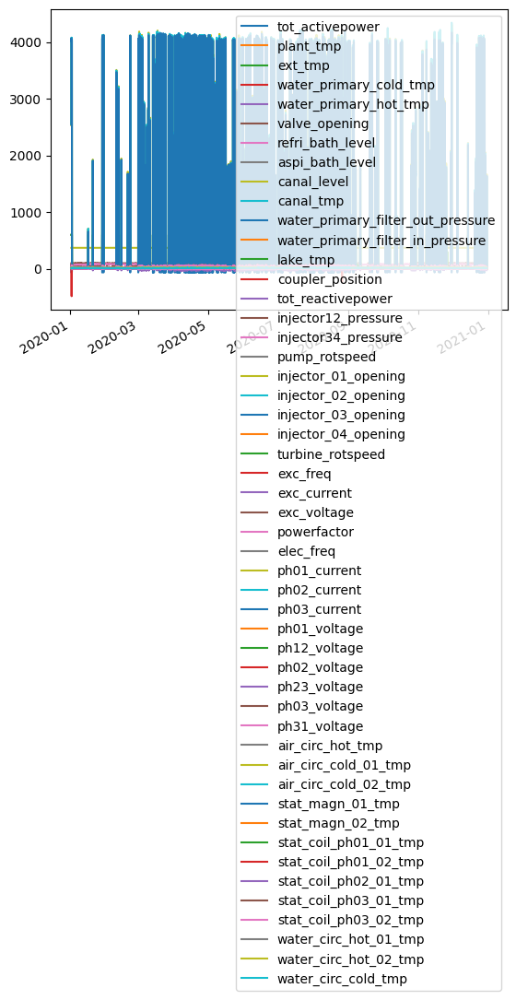

In [16]:
rds_u4.data_dict["train"].measurements[::100].plot()

In [17]:
rds_u4.data_dict["train"].measurements[::100].hvplot.explorer(y=[v for v in temperature_attrs.attribute_name.values])

BokehModel(combine_events=True, render_bundle={'docs_json': {'26677b7c-cf5c-4dde-96af-526125bc039c': {'version…

An other example would be to look at injector pressures:

In [18]:
df = rds_u4.data_dict["train"].info
temperature_attrs = df[df.attribute_name.str.contains("injector")]
temperature_attrs

,Unnamed: 0,signal_name,attribute_name,asset,unit,element,signal_type,control_signal,input_feature,output_feature,core_attribute
15,15,FMHL_SUP_VEY.MHL_VG4_PRMTU_PRES_EAU_PT12,injector12_pressure,Veytaux 1,VG4,MIV1,Measurement,True,False,True,False
16,16,FMHL_SUP_VEY.MHL_VG4_PRMTU_PRES_EAU_PT34,injector34_pressure,Veytaux 1,VG4,MIV2,Measurement,True,False,True,False
18,18,FMHL_SUP_VEY.MHL_VG4_MIPMTU_PT1_OUVERTURE,injector_01_opening,Veytaux 1,VG4,Turbine,Measurement,True,False,True,False
19,19,FMHL_SUP_VEY.MHL_VG4_MIPMTU_PT2_OUVERTURE,injector_02_opening,Veytaux 1,VG4,Turbine,Measurement,True,False,True,False
20,20,FMHL_SUP_VEY.MHL_VG4_MIPMTU_PT3_OUVERTURE,injector_03_opening,Veytaux 1,VG4,Turbine,Measurement,True,False,True,False
21,21,FMHL_SUP_VEY.MHL_VG4_MIPMTU_PT4_OUVERTURE,injector_04_opening,Veytaux 1,VG4,Turbine,Measurement,True,False,True,False
50,50,FEAT.Veytaux_1.VG4.Control.Control_Feature.tim...,timer_injector_opening,Veytaux 1,VG4,Control,Feature,True,False,False,False


In [19]:
rds_u5.data_dict["test"].measurements[::100].hvplot.explorer()

BokehModel(combine_events=True, render_bundle={'docs_json': {'6edbdebc-c137-4f66-aed6-09284d673a76': {'version…

As you can see, the test set is quite short compared to the training set. For injector 1, the test distribution is different compared to the training distribution (distribution shift).
Be aware that such distribution shifts can greatly influence the performance of your model.

In [21]:
rds_u4.data_dict["test"].measurements[::100].hvplot.explorer(y=["injector12_pressure", "injector34_pressure"])

BokehModel(combine_events=True, render_bundle={'docs_json': {'f0e1d0cc-11ee-48a1-aad2-c35d38ad957b': {'version…

We can also explore the machines in operation next to each other:

The training data sets.

In [22]:
plt = (
    rds_u4.data_dict["train"].measurements[::1000].hvplot()
    + rds_u5.data_dict["train"].measurements[::1000].hvplot()
    ).cols(1)

plt

:Layout
   .NdOverlay.I  :NdOverlay   [Variable]
      :Curve   [index]   (value)
   .NdOverlay.II :NdOverlay   [Variable]
      :Curve   [index]   (value)

We see that the test datasets are recorded troughout different seasons, which can have an impact on the recorded data.

In [23]:
plt = (
    rds_u4.data_dict["test"].measurements[::1000].hvplot()
    + rds_u5.data_dict["test"].measurements[::1000].hvplot()
    + rds_u6.data_dict["test"].measurements[::1000].hvplot()
    ).cols(1)

plt

:Layout
   .NdOverlay.I   :NdOverlay   [Variable]
      :Curve   [index]   (value)
   .NdOverlay.II  :NdOverlay   [Variable]
      :Curve   [index]   (value)
   .NdOverlay.III :NdOverlay   [Variable]
      :Curve   [index]   (value)

Now it's your turn. Try to explore the data as much as possible before engineering the solution. The main difficulty in real-world problems often isn't the complexity, but understanding the actual problem you are trying to solve, as there is no "guidance" like in the exercises you saw throughout this class. Remember, there are always trade-offs when selecting a model which you should evaluate before investing a lot of time on the implementation.

In [12]:
vg4_train_meas = rds_u4.data_dict["train"].measurements
vg4_train_info = rds_u4.data_dict["train"].info
vg4_test_meas = rds_u4.data_dict["test"].measurements
vg4_test_info = rds_u4.data_dict["test"].info

In [13]:
vg4_train_meas.columns

Index(['tot_activepower', 'plant_tmp', 'ext_tmp', 'water_primary_cold_tmp',
       'water_primary_hot_tmp', 'valve_opening', 'refri_bath_level',
       'aspi_bath_level', 'canal_level', 'canal_tmp',
       'water_primary_filter_out_pressure', 'water_primary_filter_in_pressure',
       'lake_tmp', 'coupler_position', 'tot_reactivepower',
       'injector12_pressure', 'injector34_pressure', 'pump_rotspeed',
       'injector_01_opening', 'injector_02_opening', 'injector_03_opening',
       'injector_04_opening', 'turbine_rotspeed', 'exc_freq', 'exc_current',
       'exc_voltage', 'powerfactor', 'elec_freq', 'ph01_current',
       'ph02_current', 'ph03_current', 'ph01_voltage', 'ph12_voltage',
       'ph02_voltage', 'ph23_voltage', 'ph03_voltage', 'ph31_voltage',
       'air_circ_hot_tmp', 'air_circ_cold_01_tmp', 'air_circ_cold_02_tmp',
       'stat_magn_01_tmp', 'stat_magn_02_tmp', 'stat_coil_ph01_01_tmp',
       'stat_coil_ph01_02_tmp', 'stat_coil_ph02_01_tmp',
       'stat_coil_ph03_01_

In [26]:
print(f"total train: {len(vg4_train_meas)}")
print(f"turbine equilibrium : {len(vg4_train_meas[vg4_train_meas['equilibrium_turbine_mode'] == True])}")
print(f"pump equilibrium : {len(vg4_train_meas[vg4_train_meas['equilibrium_pump_mode'] == True])}")
print(f"both equilibrium : {len(vg4_train_meas[(vg4_train_meas['equilibrium_turbine_mode'] == True) & (vg4_train_meas['equilibrium_pump_mode'] == True)])}")



total train: 1039924
turbine equilibrium : 63864
pump equilibrium : 91143
both equilibrium : 0


<Figure size 1000x800 with 0 Axes>

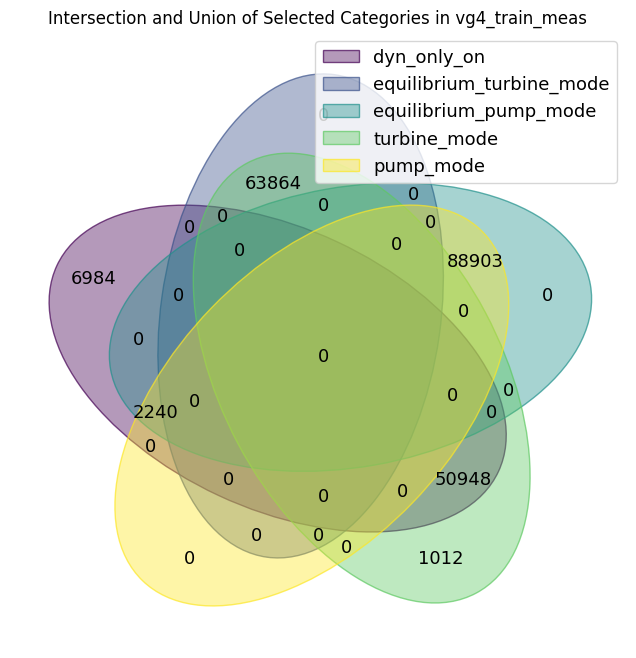

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
from venn import venn

# Assuming your DataFrame is already loaded as `vg4_train_meas`

# Define the selected columns for visualization
selected_columns = ['dyn_only_on', 'equilibrium_turbine_mode', 
                    'equilibrium_pump_mode', 'turbine_mode', 'pump_mode']

# Create a dictionary for Venn diagram sets
venn_dict = {}

# Loop through each column and set a unique label for each True/False set
for col in selected_columns:
    venn_dict[col] = set(vg4_train_meas.index[vg4_train_meas[col] == True])

# Plot the Venn diagram
plt.figure(figsize=(10, 8))
venn(venn_dict)
plt.title("Intersection and Union of Selected Categories in vg4_train_meas")
plt.show()


In [28]:
vg4_train_meas_filtered = vg4_train_meas [ (vg4_train_meas['equilibrium_turbine_mode'] == True) | (vg4_train_meas['equilibrium_pump_mode'] == True) ]

In [29]:
print(f"total train filtered: {len(vg4_train_meas_filtered)}")

total train filtered: 155007


In [14]:
vg5_train_meas = rds_u5.data_dict["train"].measurements
vg5_train_info = rds_u5.data_dict["train"].info
vg5_test_meas = rds_u5.data_dict["test"].measurements
vg5_test_info = rds_u5.data_dict["test"].info

In [31]:
rds_u5.data_dict.keys()

dict_keys(['test', 'train', 'test_s01', 'test_s02'])

In [32]:
vg5_train_meas.columns

Index(['tot_activepower', 'ext_tmp', 'plant_tmp', 'charge', 'coupler_position',
       'injector_01_opening', 'injector_02_opening', 'injector_03_opening',
       'injector_04_opening', 'injector_05_opening', 'pump_calculated_flow',
       'pump_pressure_diff', 'pump_rotspeed', 'tot_current',
       'tot_effectivepower', 'tot_reactivepower', 'turbine_pressure',
       'turbine_rotspeed', 'water_primary_pump_01_opening',
       'water_primary_pump_02_opening', 'air_circ_cold_01_tmp',
       'air_circ_cold_02_tmp', 'air_circ_cold_03_tmp', 'air_circ_cold_04_tmp',
       'air_circ_cold_05_tmp', 'air_circ_cold_06_tmp', 'air_circ_hot_01_tmp',
       'air_circ_hot_02_tmp', 'air_circ_hot_03_tmp', 'air_circ_hot_04_tmp',
       'air_circ_hot_05_tmp', 'air_circ_hot_06_tmp', 'elec_freq',
       'exc_current', 'exc_voltage', 'mid_voltage', 'neutral_current',
       'ph01_current', 'ph01_voltage', 'ph12_voltage', 'ph02_current',
       'ph02_voltage', 'ph23_voltage', 'ph03_current', 'ph03_voltage',


In [33]:
vg5_train_filt = vg5_train_meas [ (vg5_train_meas['equilibrium_turbine_mode'] == True) |
                                           ((vg5_train_meas['equilibrium_pump_mode'] == True) & (vg5_train_meas['short_circuit_mode'] == False)) |
                                           ((vg5_train_meas['equilibrium_pump_mode'] == True) & (vg5_train_meas['short_circuit_mode'] == True) & (vg5_train_meas['equilibrium_short_circuit_mode'] == True)) ]

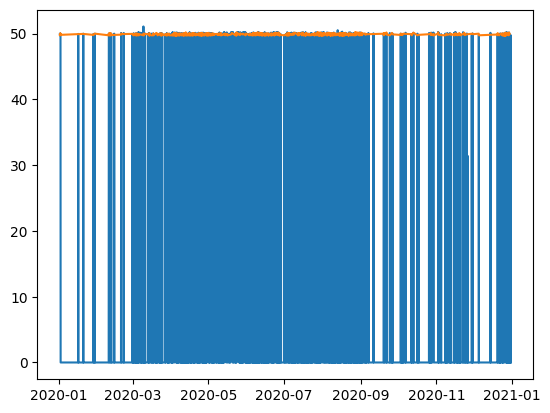

In [34]:
plt.plot(vg4_train_meas["elec_freq"][::100])
plt.plot(vg4_train_meas_filtered["elec_freq"][::100])

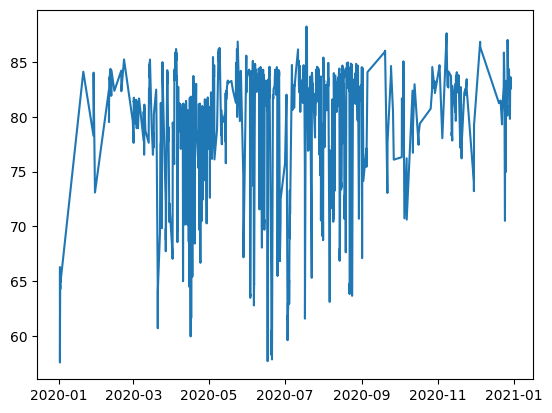

In [35]:
plt.plot(vg4_train_meas_filtered["injector34_pressure"][::100])

In [15]:
rds_u5.data_dict["test_s01"].measurements.columns

df = rds_u5.data_dict["test_s01"].info
temperature_attrs = df[df.attribute_name.str.contains("gr")]
temperature_attrs

,Unnamed: 0,signal_name,attribute_name,asset,unit,element,signal_type,control_signal,input_feature,output_feature,core_attribute


In [16]:
vg5_s1 = rds_u5.data_dict["test_s01"].measurements          # synthetic testing
vg5_s1_filt = vg5_s1 [ (vg5_s1['equilibrium_turbine_mode'] == True) |        # filtered synthetic testing
                    ((vg5_s1['equilibrium_pump_mode'] == True) & (vg5_s1['short_circuit_mode'] == False)) |
                    ((vg5_s1['equilibrium_pump_mode'] == True) & (vg5_s1['short_circuit_mode'] == True) & (vg5_s1['equilibrium_short_circuit_mode'] == True)) ]

In [38]:
print(f"length of vg5_s1: {vg5_s1.shape[0]}")
print(f"length of vg5_s1_filt: {vg5_s1_filt.shape[0]}")
print(f"lost by filter: {vg5_s1.shape[0] - vg5_s1_filt.shape[0]}")

length of vg5_s1: 172740
length of vg5_s1_filt: 67428
lost by filter: 105312


In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.svm import OneClassSVM
from sklearn.metrics import classification_report

# Assuming vg5_train_filt and vg5_s1_filt are your dataframes
# Scale the data
scaler = StandardScaler()
vg5_train_scaled = scaler.fit_transform(vg5_train_filt)
vg5_s1_scaled = scaler.transform(vg5_s1_filt)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=0.95)  # Retain 95% of variance
vg5_train_pca = pca.fit_transform(vg5_train_scaled)
vg5_s1_pca = pca.transform(vg5_s1_scaled)

# Train a one-class SVM model
svm = OneClassSVM(kernel='rbf', gamma='scale', nu=0.01)
svm.fit(vg5_train_pca)

# Predict on the test set
predictions = svm.predict(vg5_s1_pca)

# Map the predictions: 1 for inliers (normal), -1 for outliers (anomalies)
anomalies = np.where(predictions == -1)[0]

# Display the results
print(f"Number of anomalies detected: {len(anomalies)}")
print("Indices of anomalies:", anomalies)

# Print classification report if you have ground truth labels (optional)
# true_labels = ...  # Replace this with actual labels if available
# print(classification_report(true_labels, predictions))


In [ ]:
vg5_s1_filt.sample(4)

,tot_activepower,ext_tmp,plant_tmp,charge,coupler_position,injector_01_opening,injector_02_opening,injector_03_opening,injector_04_opening,injector_05_opening,...,machine_on,machine_off,turbine_mode,all,equilibrium_turbine_mode,dyn_only_on,pump_mode,short_circuit_mode,equilibrium_pump_mode,equilibrium_short_circuit_mode
2021-07-05 12:56:30+02:00,19.751913,28.014603,18.729004,18.635054,8.740017,0.000000,0.000000,20.969919,0.000000,21.153582,...,True,False,True,True,True,False,False,False,False,False
2021-07-11 01:59:00+02:00,-118.589394,23.755168,18.970360,-1.671233,184.998692,0.000000,0.000000,0.000000,0.000000,0.000000,...,True,False,False,True,False,False,True,False,True,False
2021-07-29 20:16:00+02:00,123.429161,21.181760,19.064268,121.246651,9.263575,75.913452,76.238654,76.173860,76.077922,76.151169,...,True,False,True,True,True,False,False,False,False,False
2021-07-24 10:46:00+02:00,-118.800591,31.505765,19.650624,-1.384940,185.064114,0.000000,0.000000,0.000000,0.000000,0.000000,...,True,False,False,True,False,False,True,False,True,False


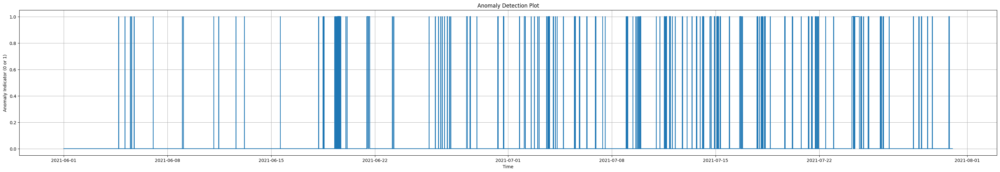

In [ ]:
# plt.plot(vg5_s1_filt.index[anomalies])
vg5_s1_timeline = vg5_s1.index

# Assuming vg5_s1_timeline is a pandas Series of timestamps
# vg5_s1_filt.index[anomalies] are the timestamps where anomalies were detected

def plot_anomalies(timeline, anomaly_timestamps):
    # Create a series of zeros with the same length as the timeline
    anomaly_function = pd.Series(0, index=timeline)

    # Set the value to 1 where the timestamp matches the anomalies
    anomaly_function.loc[timeline.isin(anomaly_timestamps)] = 1

    # Plot the function
    plt.figure(figsize=(40, 6))
    plt.plot(timeline, anomaly_function, label='Anomaly Indicator')
    plt.xlabel('Time')
    plt.ylabel('Anomaly Indicator (0 or 1)')
    plt.title('Anomaly Detection Plot')
    plt.grid(True)
    plt.show()

# Call the function to plot anomalies
plot_anomalies(vg5_s1_timeline, vg5_s1_filt.index[anomalies])

In [ ]:
# Define sliding window parameters
window_size = 3600  # 3600 data points = 1 hour (adjust as needed)
step_size = 1800    # Step size of 1800 points = 30-minute overlap (adjust as needed)

# Standardize the data
scaler = StandardScaler()
vg5_train_scaled = scaler.fit_transform(vg5_train_filt)

# Apply PCA on the entire training set for consistency
pca = PCA(n_components=0.95)
vg5_train_pca = pca.fit_transform(vg5_train_scaled)

# Train a one-class SVM model
svm = OneClassSVM(kernel='rbf', gamma='scale', nu=0.01)
svm.fit(vg5_train_pca)

# Function to apply sliding window and make predictions
def sliding_window_predict(data, model, scaler, pca, window_size, step_size):
    num_windows = (len(data) - window_size) // step_size + 1
    anomalies = []
    
    for i in range(num_windows):
        start_idx = i * step_size
        end_idx = start_idx + window_size
        
        window_data = data[start_idx:end_idx]
        window_scaled = scaler.transform(window_data)
        window_pca = pca.transform(window_scaled)
        
        predictions = model.predict(window_pca)
        
        # Record anomalies found in the current window
        window_anomalies = np.where(predictions == -1)[0] + start_idx
        anomalies.extend(window_anomalies)
    
    return anomalies

# Predict anomalies using the sliding window approach
vg5_s1_scaled = scaler.transform(vg5_s1_filt)
anomalies_detected = sliding_window_predict(vg5_s1_scaled, svm, scaler, pca, window_size, step_size)

# Display the results
print(f"Total number of anomalies detected: {len(anomalies_detected)}")
print(f"Indices of anomalies: ", anomalies_detected)

c:\Users\jadbh\Documents\Swisse\EPFL\courses\Fall 2024\Machine Learning for Predictive Maintenance\MLPMenv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\jadbh\Documents\Swisse\EPFL\courses\Fall 2024\Machine Learning for Predictive Maintenance\MLPMenv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\jadbh\Documents\Swisse\EPFL\courses\Fall 2024\Machine Learning for Predictive Maintenance\MLPMenv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\jadbh\Documents\Swisse\EPFL\courses\Fall 2024\Machine Learning for Predictive Maintenance\MLPMenv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler

Total number of anomalies detected: 129600
Indices of anomalies:  [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(55), np.int64(56), np.int64(57), np.int64(58), np.int64(59), np.int64(60), np.int64(61), np.int64(62), np.int64(63), np.int64(64), np.int64(65), np.int64(66), np.in

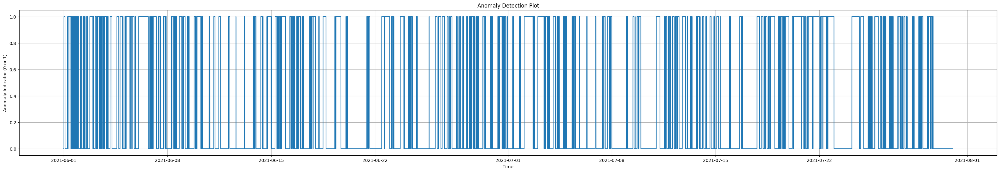

In [ ]:
plot_anomalies(vg5_s1_timeline, vg5_s1_filt.index[anomalies_detected])

In [ ]:
def plot_scree_plot(pca):
    # Plot the explained variance ratio
    plt.figure(figsize=(10, 6))
    plt.plot(1 - np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Unexplained Variance')
    plt.title('Scree Plot')
    plt.grid(True)
    plt.show()

In [ ]:
# Standardize the data
# scaler = StandardScaler()
# vg5_train_scaled = scaler.fit_transform(vg5_train_filt)

# Apply PCA on the entire training set for consistency
pca = PCA(n_components=20)
vg5_train_pca = pca.fit_transform(vg5_train_scaled)



In [ ]:
vg5_train_filt_tmp = vg5_train_filt.filter(like='tmp')
vg5_train_filt_water_circ_hot_temp = vg5_train_filt['water_circ_hot_tmp']
vg5_s1_filt_water_circ_hot_temp = vg5_s1_filt['water_circ_hot_tmp']


In [ ]:
# Parameters for sliding window
window_size = 400  # Adjust as necessary
step_size = 100  # Adjust as necessary

# Training series and test series
train_series = vg5_train_filt_water_circ_hot_temp
s1_series = vg5_s1_filt_water_circ_hot_temp

# Segment the training data into sliding windows
train_windows = []
for start in range(0, len(train_series) - window_size + 1, step_size):
    window = train_series.iloc[start:start + window_size].values
    train_windows.append(window)

# Convert training windows to a 2D numpy array
train_windows_array = np.array(train_windows)

# Train an One-Class SVM
ocsvm = OneClassSVM(kernel='rbf', gamma='auto', nu=0.001)  # Adjust parameters as needed
ocsvm.fit(train_windows_array)

# Test the model on s1 series using sliding windows
anomalies = []
for i in range(0, len(s1_series) - window_size + 1, step_size):
    test_window = s1_series.iloc[i:i + window_size].values.reshape(1, -1)
    prediction = ocsvm.predict(test_window)
    if prediction[0] == -1:  # -1 indicates an anomaly
        anomalies.append(s1_series.index[i])

# Print the indices of detected anomalies
print("Indices of anomalies detected:", anomalies)

Indices of anomalies detected: [Timestamp('2021-06-01 20:50:00+0200', tz='CET'), Timestamp('2021-06-01 21:58:00+0200', tz='CET'), Timestamp('2021-06-01 22:58:30+0200', tz='CET'), Timestamp('2021-06-01 23:48:30+0200', tz='CET'), Timestamp('2021-06-02 03:42:00+0200', tz='CET'), Timestamp('2021-06-02 04:32:00+0200', tz='CET'), Timestamp('2021-06-02 07:34:30+0200', tz='CET'), Timestamp('2021-06-02 08:35:00+0200', tz='CET'), Timestamp('2021-06-02 10:02:00+0200', tz='CET'), Timestamp('2021-06-02 13:36:00+0200', tz='CET'), Timestamp('2021-06-02 21:27:00+0200', tz='CET'), Timestamp('2021-06-02 22:17:00+0200', tz='CET'), Timestamp('2021-06-02 23:30:00+0200', tz='CET'), Timestamp('2021-06-03 00:30:30+0200', tz='CET'), Timestamp('2021-06-03 03:48:30+0200', tz='CET'), Timestamp('2021-06-03 04:38:30+0200', tz='CET'), Timestamp('2021-06-03 19:51:30+0200', tz='CET'), Timestamp('2021-06-03 20:41:30+0200', tz='CET'), Timestamp('2021-06-03 21:49:30+0200', tz='CET'), Timestamp('2021-06-03 23:01:00+0200',

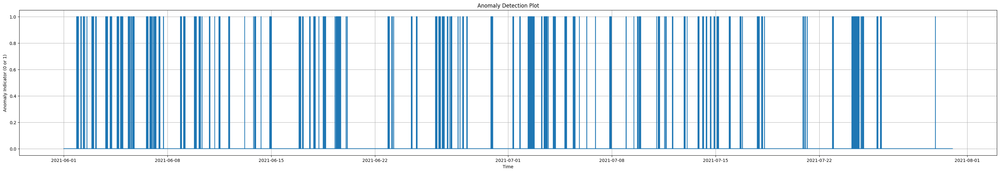

In [ ]:
plot_anomalies(vg5_s1_timeline, anomalies)

# ACTUAL WORK NOW

In [2]:
vg5_train_meas.reset_index(inplace=True)
vg5_train_filt = vg5_train_meas [ (vg5_train_meas['equilibrium_turbine_mode'] == True) |
                                           ((vg5_train_meas['equilibrium_pump_mode'] == True) & (vg5_train_meas['short_circuit_mode'] == False)) |
                                           ((vg5_train_meas['equilibrium_pump_mode'] == True) & (vg5_train_meas['short_circuit_mode'] == True) & (vg5_train_meas['equilibrium_short_circuit_mode'] == True)) ]

NameError: name 'vg5_train_meas' is not defined

In [91]:
# summary of VG5 useful variables

vg5_train_info
vg5_train_filt      # equilibirum
vg5_train_meas

vg5_test_info
vg5_test_meas

vg5_s1
vg5_s1_filt         # equilibrium

print()

In [92]:
df = vg5_train_filt
df.columns

Index(['index', 'tot_activepower', 'ext_tmp', 'plant_tmp', 'charge',
       'coupler_position', 'injector_01_opening', 'injector_02_opening',
       'injector_03_opening', 'injector_04_opening', 'injector_05_opening',
       'pump_calculated_flow', 'pump_pressure_diff', 'pump_rotspeed',
       'tot_current', 'tot_effectivepower', 'tot_reactivepower',
       'turbine_pressure', 'turbine_rotspeed', 'water_primary_pump_01_opening',
       'water_primary_pump_02_opening', 'air_circ_cold_01_tmp',
       'air_circ_cold_02_tmp', 'air_circ_cold_03_tmp', 'air_circ_cold_04_tmp',
       'air_circ_cold_05_tmp', 'air_circ_cold_06_tmp', 'air_circ_hot_01_tmp',
       'air_circ_hot_02_tmp', 'air_circ_hot_03_tmp', 'air_circ_hot_04_tmp',
       'air_circ_hot_05_tmp', 'air_circ_hot_06_tmp', 'elec_freq',
       'exc_current', 'exc_voltage', 'mid_voltage', 'neutral_current',
       'ph01_current', 'ph01_voltage', 'ph12_voltage', 'ph02_current',
       'ph02_voltage', 'ph23_voltage', 'ph03_current', 'ph03_v

In [114]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader

class SlidingWindowDataset(Dataset):
    def __init__(self, dataframe, feature_columns, window_size, step_size=1):
        """
        Args:
            dataframe (pd.DataFrame): The dataframe containing sensor data.
            feature_columns (list): List of column names for features.
            window_size (int): The number of timesteps in each sliding window.
            step_size (int): The step size to slide the window.
        """
        self.features = dataframe[feature_columns].values
        self.window_size = window_size
        self.step_size = step_size
        self.num_samples = (len(self.features) - window_size) // step_size + 1

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        start_idx = idx * self.step_size
        end_idx = start_idx + self.window_size
        x = torch.tensor(self.features[start_idx:end_idx], dtype=torch.float32)
        return x

# Example usage
# Replace 'feature_columns' with your list of feature column names
feature_columns = ["ext_tmp", "injector_01_opening"]  # Replace with your column names
window_size = 10  # Number of timesteps per window
step_size = 1  # Step size for sliding window

# Create Dataset and DataLoader
dataset = SlidingWindowDataset(df, feature_columns, window_size, step_size)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Example: Iterating through the dataloader
for batch in dataloader:
    sliding_windows = batch
    print(sliding_windows.shape)  # Replace with your training loop logic
    break

torch.Size([32, 10, 2])


In [121]:
df2 = df.copy()
df2['index_num'] = df2.index
df2.sample(2)

,index,tot_activepower,ext_tmp,plant_tmp,charge,coupler_position,injector_01_opening,injector_02_opening,injector_03_opening,injector_04_opening,...,machine_off,turbine_mode,all,equilibrium_turbine_mode,dyn_only_on,pump_mode,short_circuit_mode,equilibrium_pump_mode,equilibrium_short_circuit_mode,index_num
564946,2020-07-16 09:10:30+02:00,80.699638,16.864218,17.958692,80.512536,9.294462,38.261997,38.261997,38.489051,38.20503,...,False,True,True,True,False,False,False,False,False,564946
295310,2020-04-13 15:27:30+02:00,-121.825371,14.239693,14.775508,-1.503670,185.050152,0.000000,0.000000,0.000000,0.00000,...,False,False,True,False,False,True,False,True,False,295310


In [ ]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np

class SlidingWindowDataset(Dataset):
    def __init__(self, dataframe, feature_columns, window_size, step_size=1, max_gap=10):
        """
        Args:
            dataframe (pd.DataFrame): The dataframe containing sensor data.
            feature_columns (list): List of column names for features.
            window_size (int): The number of timesteps in each sliding window.
            step_size (int): The step size to slide the window.
            max_gap (int): Maximum allowed gap between consecutive indices for grouping.
        """
        self.features = dataframe[feature_columns].values
        self.indices = dataframe.index.values
        self.window_size = window_size
        self.step_size = step_size
        self.max_gap = max_gap

        # Identify groups based on index gaps
        self.groups = self._identify_groups()
        # print(self.groups[0:50])
        # print(len(self.groups[500]))
        self.valid_windows = self._generate_valid_windows()

    def _identify_groups(self):
        """
        Identify groups of rows based on the max_gap condition.
        """
        groups = []
        current_group = [0]  # Start with the first row
        for i in range(1, len(self.indices)):
            if self.indices[i] - self.indices[i - 1] > self.max_gap:
                groups.append(current_group)
                current_group = [i]
            else:
                current_group.append(i)
        groups.append(current_group)  # Add the last group
        return groups

    def _generate_valid_windows(self):
        """
        Generate valid sliding windows based on groups.
        """
        valid_windows = []
        for group in self.groups:
            for start in range(len(group) - self.window_size + 1):
                valid_windows.append(group[start : start + self.window_size])
        return valid_windows

    def __len__(self):
        return len(self.valid_windows)

    def __getitem__(self, idx):
        """
        Retrieve a sliding window by index.
        """
        window_indices = self.valid_windows[idx]
        x = torch.tensor(self.features[window_indices], dtype=torch.float32)
        return x

# Example usage
# Replace 'feature_columns' with your list of feature column names
feature_columns = ["ext_tmp", "index_num"]  # Replace with your column names
window_size = 10    # Number of timesteps per window
step_size = 1    # Step size for sliding window
max_gap = 10   # Maximum allowed gap for grouping

# Create Dataset and DataLoader
dataset = SlidingWindowDataset(df2, feature_columns, window_size, step_size, max_gap)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

maxes = []
# Example: Iterating through the dataloader
for i, batch in enumerate(dataloader):
    sliding_windows = batch
    diff = sliding_windows[0,1:10,1] - sliding_windows[0,0:9,1]
    maxes.append(diff.max().item())
    # print(maxes)  # Replace with your training loop logi
    # if i>100:
    #     break
# plt.hist(maxes)
pd_maxes = pd.DataFrame(maxes)

In [164]:
pd_maxes.value_counts()

0  
1.0    13896
2.0       33
3.0       12
4.0        3
5.0        1
8.0        1
Name: count, dtype: int64

In [85]:
import pandas as pd
import numpy as np

# Sample DataFrame for testing
data = {
    'index': [0, 1, 2, 10, 11, 12, 20, 21],
    'ext_tmp': [22.5, 22.7, 22.4, 23.1, 23.3, 23.2, 24.0, 24.1],
    'injector_01_opening': [1.2, 1.1, 1.3, 1.5, 1.6, 1.4, 1.9, 2.0]
}
df = pd.DataFrame(data).set_index('index')

# Define parameters
feature_columns = ['ext_tmp', 'injector_01_opening']
window_size = 2
step_size = 1
max_gap = 5

# Initialize the SlidingWindowDataset
dataset = SlidingWindowDataset(df, feature_columns, window_size, step_size, max_gap)

# Helper function to test the segmentation
def test_segmentation(dataset):
    print("Testing segmentation and window creation...")
    
    # Check groups
    print("Identified groups based on max_gap:")
    for group in dataset.groups:
        group_indices = [dataset.indices[i] for i in group]
        print(group_indices)
    
    # Check windows
    print("\nGenerated valid windows:")
    for i, window in enumerate(dataset.valid_windows):
        window_indices = [dataset.indices[idx] for idx in window]
        print(f"Window {i + 1}: {window_indices}")
    
    # Check data retrieval
    print("\nData tensors for first few windows:")
    for i in range(min(len(dataset), 3)):  # Display the first few windows
        print(f"Window {i + 1} data:\n{dataset[i].numpy()}")

# Run the test function
test_segmentation(dataset)


Testing segmentation and window creation...
Identified groups based on max_gap:
[np.int64(0), np.int64(1), np.int64(2)]
[np.int64(10), np.int64(11), np.int64(12)]
[np.int64(20), np.int64(21)]

Generated valid windows:
Window 1: [np.int64(0), np.int64(1)]
Window 2: [np.int64(1), np.int64(2)]
Window 3: [np.int64(10), np.int64(11)]
Window 4: [np.int64(11), np.int64(12)]
Window 5: [np.int64(20), np.int64(21)]

Data tensors for first few windows:
Window 1 data:
[[22.5  1.2]
 [22.7  1.1]]
Window 2 data:
[[22.7  1.1]
 [22.4  1.3]]
Window 3 data:
[[23.1  1.5]
 [23.3  1.6]]
